<a href="https://www.kaggle.com/code/alirezasoltanikh/neuromatch-fmri-emotion?scriptVersionId=140936454" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# **Fearful Stimuli Processing - Neuromatch Computational Neuroscience**

This notebook aims to investigate the most important regions and networks involved in emotion processing.  
The analyses will be performed on BOLD fMRI signals of 360 parcels during two tasks: 1. fearful face stimuli and 2. neutral face stimuli.  
Data are derived from Human Connectome Project (HCP).


# 1. Loading needed libraries

In [1]:
import os, requests, tarfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
import requests
import seaborn as sns
import copy
from collections import Counter
# Necessary for visualization
from nilearn import plotting, datasets

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/main/nma.mplstyle")

# 2. Downloading the needed data

In [3]:
fnames = ["hcp_covariates.tgz",
          "atlas.npz", 
          "hcp_task.tgz"]

urls = ["https://osf.io/x5p4g/download",
        "https://osf.io/j5kuc/download",
        "https://osf.io/2y3fw/download"]

for fname, url in zip(fnames, urls):
    if not os.path.isfile(fname):
        try:
            r = requests.get(url)
        except requests.ConnectionError:
            print("!!! Failed to download data !!!")
        else:
            if r.status_code != requests.codes.ok:
                print("!!! Failed to download data !!!")
            else:
                print(f"Downloading {fname}...")
                with open(fname, "wb") as fid:
                    fid.write(r.content)
                    print(f"Download {fname} completed!")

Download hcp_covariates.tgz completed!
Download atlas.npz completed!
Download hcp_task.tgz completed!


#### Extracting the tgz and npz files and setting the needed parameters.

In [4]:
with tarfile.open("hcp_covariates.tgz") as tfile:
    tfile.extractall(".")
with tarfile.open("hcp_task.tgz") as tfile:
    tfile.extractall(".")
with np.load("atlas.npz") as dobj:
    atlas = dict(**dobj)

In [5]:
# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 100

# The data have already been aggregated into ROIs from the Glasser parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in seconds

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated twice in each subject
RUNS   = ['LR','RL']
N_RUNS = 2

# Path to the data
HCP_DIR = "./hcp_task"

# There are 7 tasks. Each has a number of 'conditions'
# TIP: look inside the data folders for more fine-graned conditions

EXPERIMENTS = {
    'MOTOR'      : {'cond':['lf','rf','lh','rh','t','cue']},
    'WM'         : {'cond':['0bk_body','0bk_faces','0bk_places','0bk_tools','2bk_body','2bk_faces','2bk_places','2bk_tools']},
    'EMOTION'    : {'cond':['fear','neut']},
    'GAMBLING'   : {'cond':['loss','win']},
    'LANGUAGE'   : {'cond':['math','story']},
    'RELATIONAL' : {'cond':['match','relation']},
    'SOCIAL'     : {'cond':['ment','rnd']}
}

In [6]:
subjects = np.loadtxt(os.path.join(HCP_DIR, "subjects_list.txt"))
subjects = subjects.astype(int)
regions = np.load(os.path.join(HCP_DIR, 'regions.npy')).T
region_info = dict(
    name=regions[0].tolist(),
    network=regions[1],
    hemi=['Right']*int(N_PARCELS/2) + ['Left']*int(N_PARCELS/2),
)

#### Exploring the characters of regions and subjects

In [7]:
print("The number of subjects are {}".format(len(subjects)) + 
      ", and the avialable information regarding the regions of the brain are:", list(region_info.keys()))
print(f"\nThe number of available networks are: {len(Counter(list(region_info.values())[1]))} \n\n", 
      Counter(list(region_info.values())[1]))

The number of subjects are 100, and the avialable information regarding the regions of the brain are: ['name', 'network', 'hemi']

The number of available networks are: 12 

 Counter({'Posterior-Mu': 77, 'Cingulo-Oper': 56, 'Visual2': 54, 'Frontopariet': 50, 'Somatomotor': 39, 'Language': 23, 'Default': 23, 'Auditory': 15, 'Dorsal-atten': 7, 'Visual1': 6, 'Orbito-Affec': 6, 'Ventral-Mult': 4})


## 3. Exploring and cleaning the data
#### Helper functions to get timeseries BOLD signal for single subject and single run

In [8]:
def load_single_timeseries(subject, experiment, run, remove_mean=True):
    """Load timeseries data for a single subject and single run.

    Args:
        subject (str):      subject ID to load
        experiment (str):   Name of experiment
        run (int):          (0 or 1)
        remove_mean (bool): If True, subtract the parcel-wise mean (typically the mean BOLD signal is not of interest)

    Returns
        ts (n_parcel x n_timepoint array): Array of BOLD data values
    """
    bold_run  = RUNS[run]
    bold_path = f"{HCP_DIR}/subjects/{subject}/{experiment}/tfMRI_{experiment}_{bold_run}"
    bold_file = "data.npy"
    ts = np.load(f"{bold_path}/{bold_file}")
    if remove_mean:
        ts -= ts.mean(axis=1, keepdims=True)
    return ts


def load_evs(subject, experiment, run):
    """Load EVs (explanatory variables) data for one task experiment.

    Args:
        subject (str): subject ID to load
        experiment (str) : Name of experiment
        run (int): 0 or 1

    Returns
        evs (list of lists): A list of frames associated with each condition

    """
    frames_list = []
    task_key = f'tfMRI_{experiment}_{RUNS[run]}'
    for cond in EXPERIMENTS[experiment]['cond']:
        ev_file  = f"{HCP_DIR}/subjects/{subject}/{experiment}/{task_key}/EVs/{cond}.txt"
        ev_array = np.loadtxt(ev_file, ndmin=2, unpack=True)
        ev       = dict(zip(["onset", "duration", "amplitude"], ev_array))
        # Determine when trial starts, rounded down
        start = np.floor(ev["onset"] / TR).astype(int)
        # Use trial duration to determine how many frames to include for trial
        duration = np.ceil(ev["duration"] / TR).astype(int)

        frames = []
        for index, _ in enumerate(start):
            _start = start[index]

            # HACK: Forces all block to be 15 frames in length. In reality all but the last are 25 frames.
            _duration =  15 # duration[index]

            _frames = list(range(_start, _start + _duration))
            frames.append(_frames)

        frames_list.append(frames)

    return frames_list

#### Example run
#### Exploring the BOLD signals for a single subject and "EMOTION" experiment
The **"data"** variable contains BOLD signals for each 360 parcels of the brain for one subjects so the dimention of the variable will be (parcels, number of recorded signal within one run).  
the **"evs"** variable has 2 lists, of which the first has frames for fearful face task and the second has frames for the neutral face task. Each of 2 lists has 3 lists (blocks) of 15 frames (instead of 25, since our data contains only 176 frames of BOLD signals for each frames I considered 15 frames for each experiment to not to exceed the data index) which are the indices for BOLD data.

In [9]:
my_exp = 'EMOTION'
my_subj = subjects[13]
my_run = 0

data = load_single_timeseries(subject=my_subj,
                              experiment=my_exp,
                              run=my_run,
                              remove_mean=True)
evs = load_evs(subject=my_subj, experiment=my_exp, run=my_run)
print(data.shape, "\n\n", "fear evs: ", evs[0], "\n\n", "neut evs: ", evs[1])

(360, 176) 

 fear evs:  [[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58], [103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117], [161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175]] 

 neut evs:  [[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87], [132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146]]


Here the **"average_frames""** function calculates the mean BOLD signals for each experiment ("fearful face" or "neutral face") for each subject. So our "data" variable with primary (360, 176) shape, will become one dimensional variable (360, ).

In [10]:
# we need a little function that averages all frames from any given condition
def average_frames(data, evs, experiment, cond):
    idx = EXPERIMENTS[experiment]['cond'].index(cond)
    return np.mean(np.concatenate([np.mean(data[:, evs[idx][i]], axis=1, keepdims=True) for i in range(len(evs[idx]))], axis=-1), axis=1)


fear_activity = average_frames(data, evs, my_exp, 'fear')
neut_activity = average_frames(data, evs, my_exp, 'neut')
contrast = fear_activity - neut_activity  # difference between fear and neut activity

Plotting the BOLD signal differences between "fear" and "neut" tasks within all 360 parcels of the brain.

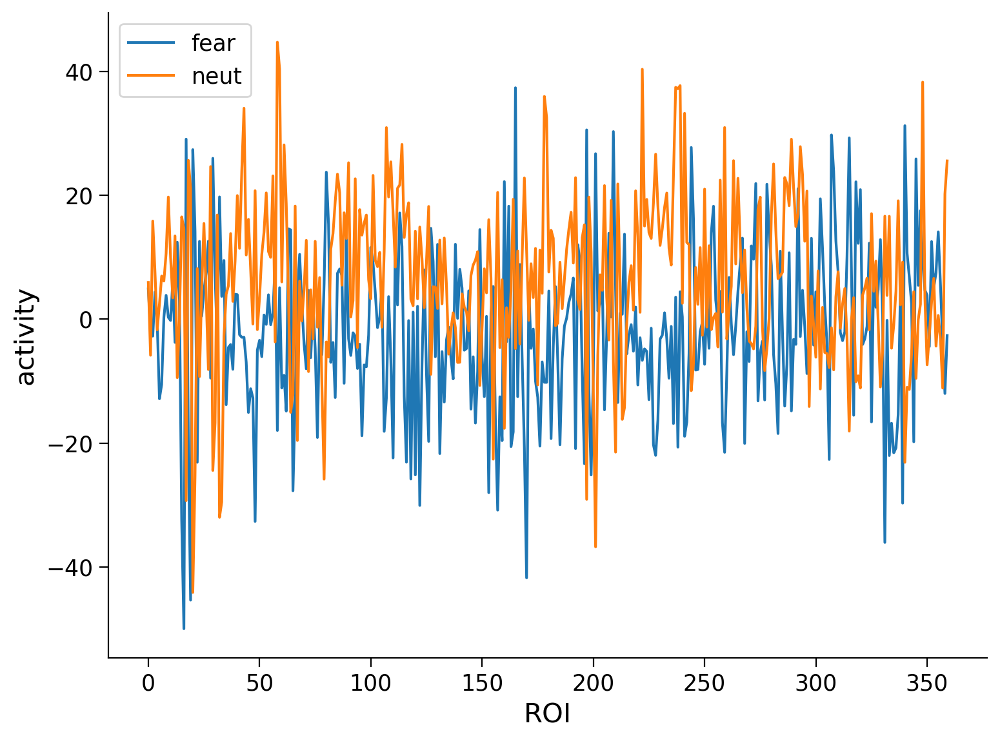

In [11]:
# Plot activity level in each ROI for both conditions
plt.plot(fear_activity,label='fear')
plt.plot(neut_activity,label='neut')
plt.xlabel('ROI')
plt.ylabel('activity')
plt.legend()
plt.show()

#### Plotting the activties within brain networks and regions

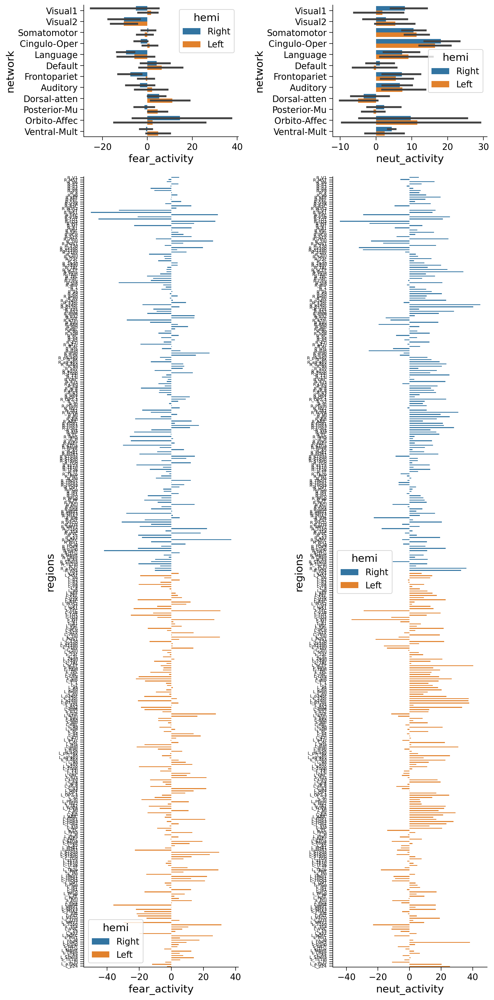

In [12]:
df = pd.DataFrame({'fear_activity' : fear_activity,
                   'neut_activity' : neut_activity,
                   'regions' : region_info['name'],
                   'network' : region_info['network'],
                   'hemi' : region_info['hemi']})

fig, axes = plt.subplots(2, 2, figsize=(10,20), height_ratios=[1, 6])
sns.barplot(y='network', x='fear_activity', data=df, hue='hemi', ax=axes[0,0])
sns.barplot(y='network', x='neut_activity', data=df, hue='hemi', ax=axes[0,1])
sns.barplot(y='regions', x='fear_activity', data=df, hue='hemi', ax=axes[1,0])
sns.barplot(y='regions', x='neut_activity', data=df, hue='hemi', ax=axes[1,1])
axes[1,1].tick_params(axis='y', labelsize=6) 
axes[1,0].tick_params(axis='y', labelsize=6)
plt.show()

# 4. Loading Timeseries for Individuals and Performing Subtraction Analysis for Hemispheres
The timeseries_emotion is a list of lists and have a shape of (100, 360, 176).

In [13]:
timeseries_emotion = []
for subject in subjects:
    ts_concat = load_single_timeseries(subject=subject,
                                       experiment=my_exp,
                                       run=my_run,
                                       remove_mean=True)
    timeseries_emotion.append(ts_concat)
print(np.array(timeseries_emotion).shape)

(100, 360, 176)


#### Calculating the correlation between the bold signals between parcells
Here the correlation is calculated without considering the experiments just to show the connectomes overall the bold signals.

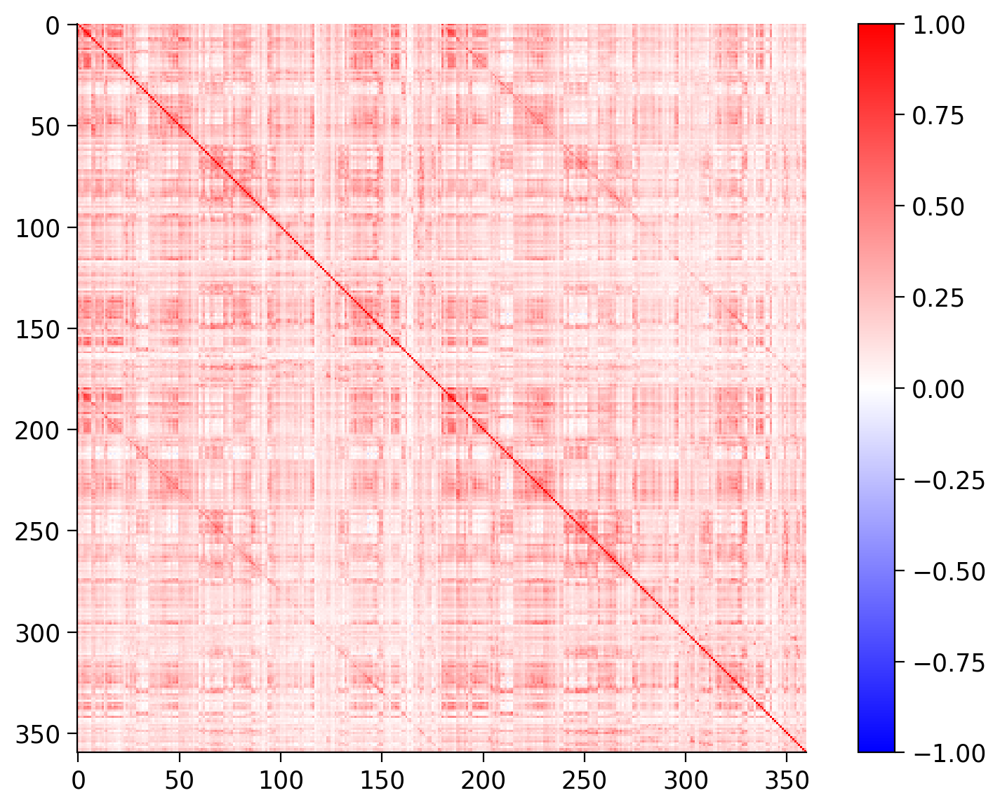

In [14]:
fc = np.zeros((N_SUBJECTS, N_PARCELS, N_PARCELS))
for sub, ts in enumerate(timeseries_emotion):
    fc[sub] = np.corrcoef(ts)
# Getting the mean of the ocrrelation coefficients within all subjects
group_fc = fc.mean(axis=0)

plt.figure()
plt.imshow(group_fc, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
plt.colorbar()
plt.show()

Plotting the connectome of the parcells

In [15]:
plotting.view_connectome(group_fc, atlas["coords"], edge_threshold="99%")

#### A simple subtraction analysis

In [16]:
contrast = []
task = "EMOTION"
conditions = EXPERIMENTS["EMOTION"]["cond"]

for subject in subjects:
    # Get the average signal in each region for each condition
    f_activity = average_frames(data, evs, my_exp, conditions[0])
    n_activity = average_frames(data, evs, my_exp, conditions[1])
    # Add the region-wise difference between fear and neut activity to the contrast
    contrast.append(f_activity - n_activity)

Plotting group-averaged contrast value across regions

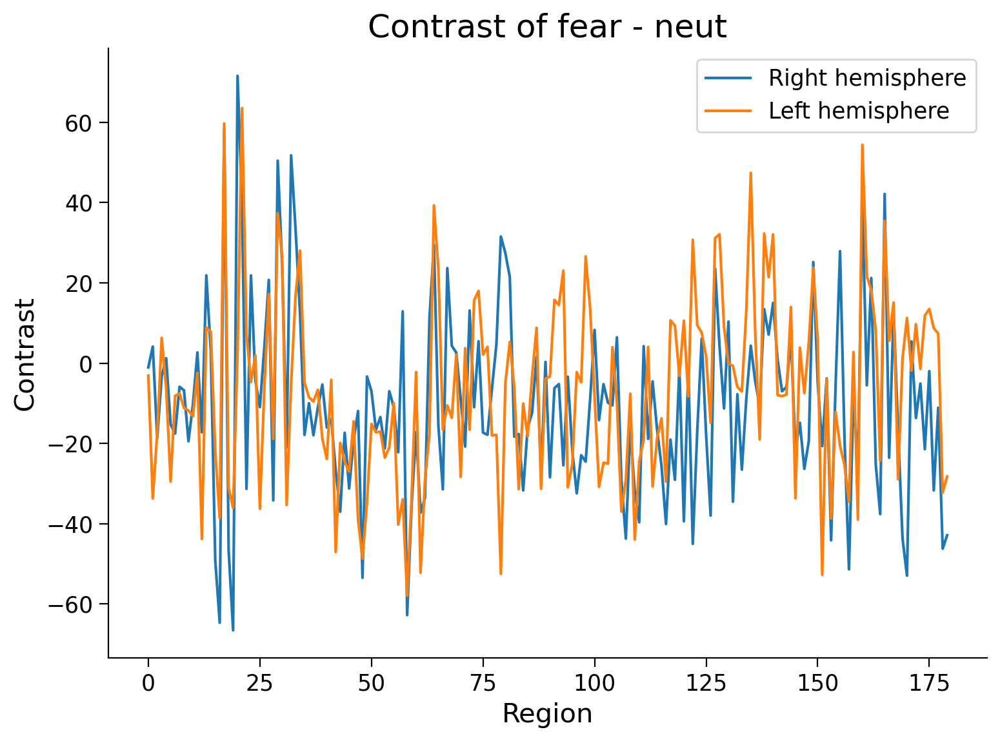

In [17]:
hemi_contrasts = np.split(np.mean(contrast, axis=0), 2)

plt.figure()
for i, hemi_contrast in enumerate(hemi_contrasts):
    plt.plot(hemi_contrast, label=f"{HEMIS[i]} hemisphere")

plt.title(f"Contrast of {conditions[0]} - {conditions[1]}")
plt.xlabel("Region")
plt.ylabel("Contrast")
plt.legend()
plt.show()

Plotting the regional values on the surface of one hemisphere:

In [18]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = np.mean(contrast, axis=0)[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'], surf_contrast, vmax=None)

#### Demonstrating values by functional networks

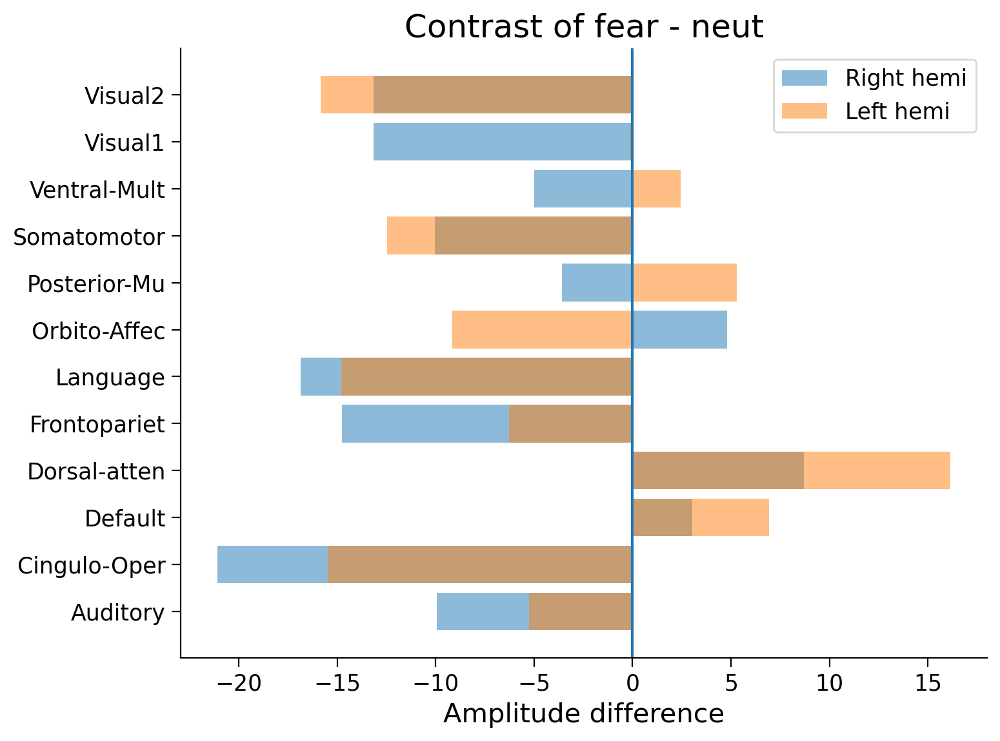

In [19]:
# Get unique network labels
net_names = np.unique(region_info["network"])

hemi_nets = np.split(region_info["network"], 2)
hemi_contrasts = np.split(np.mean(contrast, axis=0), 2)

plt.figure()
# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contrast in zip(HEMIS, hemi_nets, hemi_contrasts):
    network_vals = []
    for network in net_names:
        network_vals.append(hemi_contrast[hemi_network == network].mean())
    plt.barh(net_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title(f"Contrast of {conditions[0]} - {conditions[1]}")
plt.legend()
plt.show()

# 5. Devoloping the Models and Performing Analyses for BOLD Signals of Parcels

#### Loading needed libraries

In [20]:
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
# from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import xgboost as xgb
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from mlxtend.plotting import plot_decision_regions
import time

In [21]:
x_tot = []
y_tot = []

In [22]:
for i in range(len(subjects)):
    df = load_single_timeseries(subject=subjects[i],
                                experiment=my_exp,
                                run=my_run,
                                remove_mean=True)
    
    # to load explanatory variable
    evs = load_evs(subject=subjects[i], experiment=my_exp, run=my_run)
    # to averages all frames from any given condition
    fa = average_frames(df, evs, my_exp, 'fear')
    na = average_frames(df, evs, my_exp, 'neut')
    
    x_tot.append(fa)
    y_tot.append(1)
    x_tot.append(na)
    y_tot.append(0)

In [23]:
X = np.array(x_tot)
y = np.array(y_tot)
print(X.shape, y.shape)

(200, 360) (200,)


#### Splitting the data into train and test sets

In [24]:
# Assuming 'X' is our feature array with shape (200, 360)
# Assuming 'y' is our label array with shape (200,)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)

#### Predicting the fearful or neutral tasks based on parcels BOLD signals
Here I wanted to predict whether the participant have observed fearful or neutral face. 

#### Defining, fitting, and evaluating SVM classifier model


In [25]:
# Create and train the SVC classifier
start_time = time.time()
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)
svm_classifier.fit(X_train, y_train)
end_time = time.time()
training_time = end_time - start_time
print("Training time:", training_time, "seconds")

Training time: 0.006417751312255859 seconds


In [26]:
# Make predictions on test set
y_pred = svm_classifier.predict(X_test)

In [27]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [28]:
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
scores = cross_val_score(svm_classifier, X, y, cv=kf)
print("Cross-validation scores:", scores)
print("Average accuracy:", np.mean(scores))

Cross-validation scores: [1. 1. 1. 1. 1.]
Average accuracy: 1.0


As we expected the model performed well on this easy task with an accuracy of 1!
This was easy because there is a huge difference between the BOLD signals of regions during feaful face tasks and neutral face tasks!
Other models, including XGBoost and logistic regression did the same on this easy task.

Now I choose the most important features in the model

In [29]:
feature_weights = svm_classifier.coef_[0]
feature_weights_list = list(enumerate(feature_weights))
feature_names = region_info["name"]

In [30]:
# Create a list of tuples containing feature indices and corresponding weights
feature_weights_list = list(enumerate(feature_weights))
feature_name_list = [feature_weights_list[i] + (feature_names[i],) for i in range(len(feature_weights_list))]
# Sort the feature weights in descending order of absolute values
sorted_feature_weights = sorted(feature_name_list, key=lambda x: abs(x[1]), reverse = True)
top_10_features = sorted_feature_weights[:10]

In [31]:
top_feature_indices = []
top_feature_names = []
top_feature_weights = []
for i in range(len(top_10_features)):
    top_feature_indices.append(top_10_features[i][0])
    top_feature_weights.append(top_10_features[i][1])
    top_feature_names.append(top_10_features[i][2])

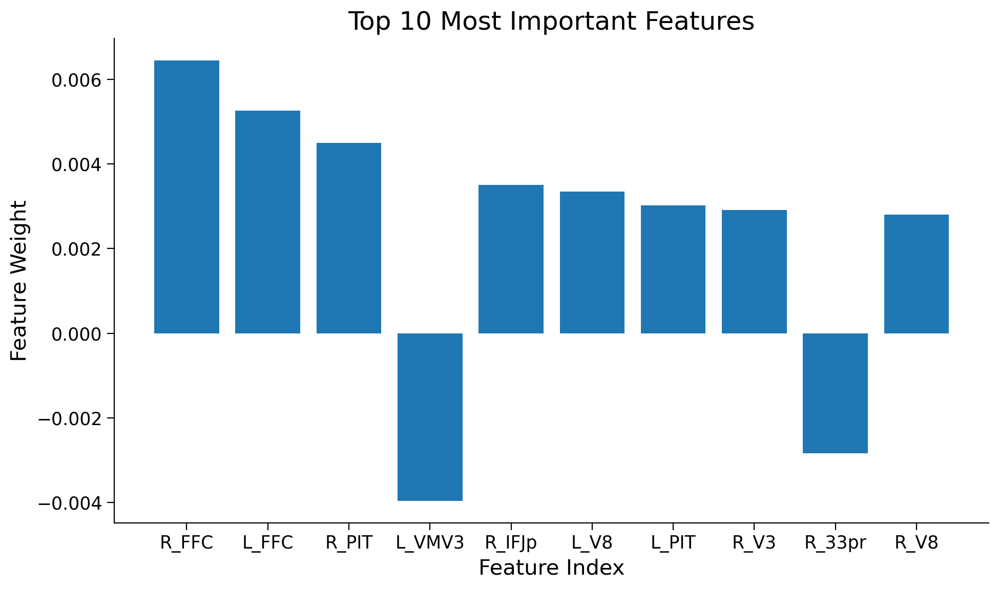

In [32]:
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_names)), top_feature_weights, align='center')
plt.xticks(range(len(top_feature_names)), top_feature_names)
plt.xlabel('Feature Index')
plt.ylabel('Feature Weight')
plt.title('Top 10 Most Important Features')
plt.show()

#### Training the model on the ten most important features

In [33]:
X_ten = X[:, top_feature_indices]

In [34]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_ten, y, test_size=0.2, random_state = 42)

In [35]:
# Create and train the SVC classifier
start_time = time.time()
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)
svm_classifier.fit(X_train, y_train)
end_time = time.time()
training_time = end_time - start_time
print("Training time:", training_time, "seconds")

Training time: 0.005417346954345703 seconds


In [36]:
# Make predictions on test set
y_pred = svm_classifier.predict(X_test)

In [37]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.975


Even with 10 features the accuracy was great!  
The XGBoost got 1.0 accuracy with this task  

In [38]:
## Create and train the XGBoost classifier
# xgb_classifier = xgb.XGBClassifier(
#     objective='binary:logistic',  # For binary classification tasks
#     learning_rate=0.1,            # Learning rate (step size) for boosting process
#     max_depth=3,                  # Maximum depth of each tree
#     n_estimators=100,             # Number of boosting rounds (trees)
#     random_state=42               # Set a random seed for reproducibility
# )
# xgb_classifier.fit(X_train, y_train)
# Make predictions on the test set
# y_pred = xgb_classifier.predict(X_test)
# Evaluate the classifier
# accuracy = accuracy_score(y_test, y_pred)
# print("Accuracy:", accuracy)

# 6. The Main Analysis Based on Connectivity with Seed Region  

Here I wanted to train the models on connectivity matrices, considering the R-FFC as the seed region to calculate the connectivity matrix.  
So considering the seed region = R-FFC, let's move forward to the models.


In [39]:
######
######
# let's move to connectivity:)
# seed_region = R-FFC

In [40]:
# Concatenating the time frames for the fear and neut tasks
evs_fear = evs[0][0] + evs[0][1] + evs[0][2]
evs_neut = evs[1][0] + evs[1][1] + evs[1][2]

In [41]:
timeseries_emotion_neut = []
timeseries_emotion_fear = []
for i in range(len(timeseries_emotion)):
    timeseries_emotion_fear.append(timeseries_emotion[i][:,evs_fear])
    timeseries_emotion_neut.append(timeseries_emotion[i][:,evs_neut])

In [42]:
# To calculate the correlations between the regions with R-FFC
fc_fear = np.zeros((N_SUBJECTS, N_PARCELS, N_PARCELS))
fc_neut = np.zeros((N_SUBJECTS, N_PARCELS, N_PARCELS))
for sub, ts in enumerate(timeseries_emotion_fear):
    fc_fear[sub] = np.corrcoef(ts)
    
for sub, ts in enumerate(timeseries_emotion_neut):
    fc_neut[sub] = np.corrcoef(ts)
    

In [43]:
# To choose the correlations with "R-FFC" 
fc_fear_X = fc_fear[:, 17, list(range(17)) + list(range(18, 360))]
fc_neut_X = fc_neut[:, 17, list(range(17)) + list(range(18, 360))]

In [44]:
# defining new region names excluding the "R-FFC"
new_region_names = copy.deepcopy(region_info["name"])
del new_region_names[17]

The following code prepares the data for the model.  
The "fc_fear_X" and "fc_neut_X" should be merged and so should their labels. 


In [45]:
X_n = np.vstack((fc_fear_X, fc_neut_X))
y_n = [0]*100 + [1]*100

In [46]:
# Our data is within -1 to 1 range  
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X_n)

In [47]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_n, y_n, test_size=0.2, random_state=42)

In [48]:
# Create and train the SVC classifier
start_time = time.time()
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)
svm_classifier.fit(X_train, y_train)
end_time = time.time()
training_time = end_time - start_time
print("Training time:", training_time, "seconds")

Training time: 0.00488591194152832 seconds


In [49]:
# Make predictions on test set
y_pred = svm_classifier.predict(X_test)

In [50]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.775


In [51]:
# K-fold cross-validation for the model
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
scores = cross_val_score(svm_classifier, X_n, y_n, cv=kf)
print("Cross-validation scores:", scores)
print("Average accuracy:", np.mean(scores))

Cross-validation scores: [0.775 0.775 0.75  0.775 0.675]
Average accuracy: 0.75


In [52]:
classification_rep = classification_report(y_test, y_pred)
print("Classification Report:")
print(classification_rep)

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.71      0.77        21
           1       0.73      0.84      0.78        19

    accuracy                           0.78        40
   macro avg       0.78      0.78      0.77        40
weighted avg       0.78      0.78      0.77        40



In [53]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.775
Precision: 0.7272727272727273
Recall: 0.8421052631578947
F1 Score: 0.7804878048780488
Confusion Matrix:
[[15  6]
 [ 3 16]]


In [54]:
feature_weights = svm_classifier.coef_[0]
feature_weights_list = list(enumerate(feature_weights))
feature_names = new_region_names

In [55]:
# Create a list of tuples containing feature indices and corresponding weights
feature_weights_list = list(enumerate(feature_weights))
feature_name_list = [feature_weights_list[i] + (feature_names[i],) for i in range(len(feature_weights_list))]
# Sort the feature weights in descending order of absolute values
sorted_feature_weights = sorted(feature_name_list, key=lambda x: abs(x[1]), reverse = True)
top_10_features = sorted_feature_weights[:10]

In [56]:
top_feature_indices = []
top_feature_names = []
top_feature_weights = []
for i in range(len(top_10_features)):
    top_feature_indices.append(top_10_features[i][0])
    top_feature_weights.append(top_10_features[i][1])
    top_feature_names.append(top_10_features[i][2])

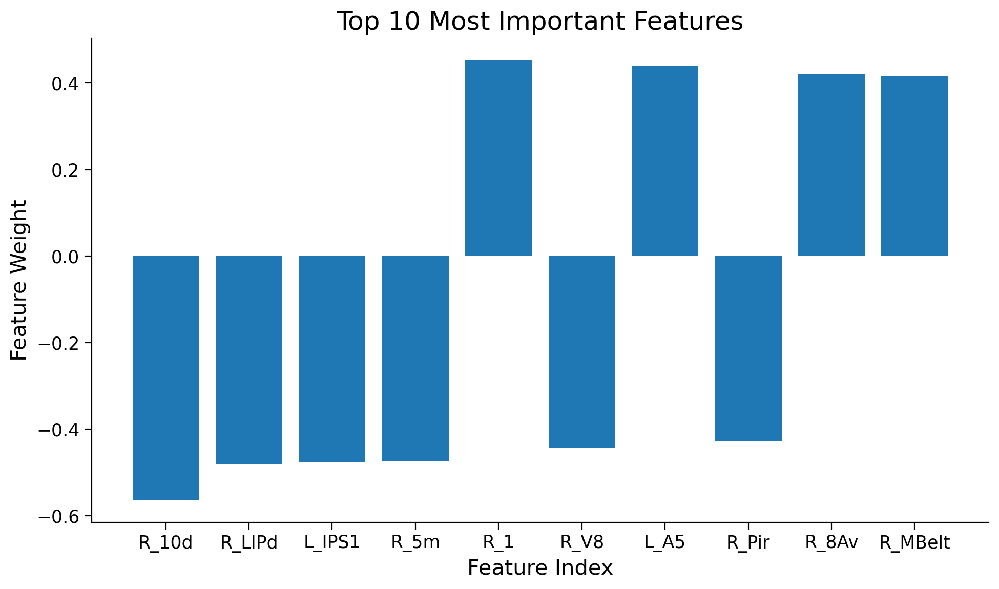

In [57]:
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_names)), top_feature_weights, align='center')
plt.xticks(range(len(top_feature_names)), top_feature_names)
plt.xlabel('Feature Index')
plt.ylabel('Feature Weight')
plt.title('Top 10 Most Important Features')
plt.show()

In [58]:
X_ten = X_n[:, top_feature_indices]

In [59]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_ten, y_n, test_size=0.2, random_state=42)

In [60]:
# Create and train the SVC classifier
start_time = time.time()
svm_classifier = SVC(kernel='linear', C=0.5, random_state=42)
svm_classifier.fit(X_train, y_train)
end_time = time.time()
training_time = end_time - start_time
print("Training time:", training_time, "seconds")

Training time: 0.004007816314697266 seconds


In [61]:
# Make predictions on test set
y_pred = svm_classifier.predict(X_test)

In [62]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.75


In [63]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.75
Precision: 0.7368421052631579
Recall: 0.7368421052631579
F1 Score: 0.7368421052631579
Confusion Matrix:
[[16  5]
 [ 5 14]]


### Performing PCA Analysis to get the 10 features

In [64]:
n_components = 10  # Number of principal components to keep
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_n)
explained_variance_ratio = pca.explained_variance_ratio_
principal_components = pca.components_
most_important_feature_indices = np.abs(principal_components).argmax(axis=1)
components_name = [new_region_names[i] for i in most_important_feature_indices]
print("Explained Variance Ratio:", explained_variance_ratio, f"\n components: {components_name}")
print("Total Explained Variance:", np.sum(explained_variance_ratio))

Explained Variance Ratio: [0.26693107 0.06708904 0.03958709 0.03579116 0.03266691 0.02289935
 0.02191737 0.01983839 0.01755573 0.01507422] 
 components: ['R_PGs', 'L_9m', 'R_PF', 'R_IFSa', 'L_POS1', 'R_a9-46v', 'L_6mp', 'L_FOP4', 'L_TGd', 'R_6mp']
Total Explained Variance: 0.5393503206047986


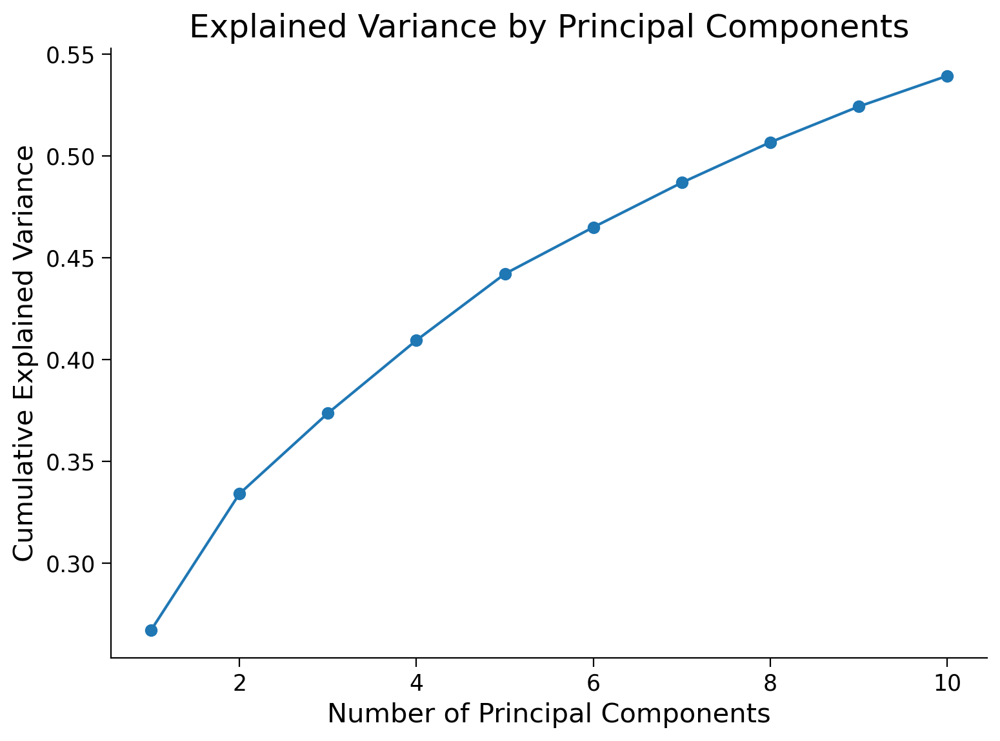

In [65]:
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.plot(range(1, n_components + 1), cumulative_variance_ratio, marker='o')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance by Principal Components")
plt.show()

In [66]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_n, test_size=0.2, random_state=42)

In [67]:
# Create and train the SVC classifier
start_time = time.time()
svm_classifier = SVC(kernel='linear', C=0.5, random_state=42)
svm_classifier.fit(X_train, y_train)
end_time = time.time()
training_time = end_time - start_time
print("Training time:", training_time, "seconds")

Training time: 0.004594564437866211 seconds


In [68]:
# Make predictions on test set
y_pred = svm_classifier.predict(X_test)

In [69]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.75


In [70]:
# K-fold cross-validation for the model
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
scores = cross_val_score(svm_classifier, X_pca, y_n, cv=kf)
print("Cross-validation scores:", scores)
print("Average accuracy:", np.mean(scores))

Cross-validation scores: [0.75  0.625 0.75  0.8   0.75 ]
Average accuracy: 0.735


In [71]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.75
Precision: 0.7142857142857143
Recall: 0.7894736842105263
F1 Score: 0.7500000000000001
Confusion Matrix:
[[15  6]
 [ 4 15]]


Almost the same accuracy acheived with the 10 most important PCA components! 

We will move forward to try further models on PCA components to see whether the accuracy get improved.

In [72]:
# performing random search to get the best hyperparameters
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5]
}
# Here do to low dimensions even the grid search is not that much computationally heavy 
xgb_classifier = xgb.XGBClassifier(objective='binary:logistic')
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, cv=3)
grid_search.fit(X_train, y_train)
random_search = RandomizedSearchCV(estimator=xgb_classifier, param_distributions=param_grid, n_iter=10, cv=3)
random_search.fit(X_train, y_train)
print("Best Parameters: \n1. Random: ", random_search.best_params_, "\n2. Grid: ", grid_search.best_params_)

Best Parameters: 
1. Random:  {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.01} 
2. Grid:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200}


In [73]:
# Create and train the XGBoost classifier
xgb_classifier = xgb.XGBClassifier(
    objective='binary:logistic',  # For binary classification tasks
    learning_rate=.01,            # Learning rate (step size) for boosting process
    max_depth=3,                  # Maximum depth of each tree
    n_estimators=200             # Number of boosting rounds (trees)
)
xgb_classifier.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [74]:
# Make predictions on the test set
y_pred = xgb_classifier.predict(X_test)

In [75]:
# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.725


In [76]:
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

In [77]:
scores = cross_val_score(xgb_classifier, X_pca, y_n, cv=kf)
print("Cross-validation scores:", scores)
print("Average accuracy:", np.mean(scores))

Cross-validation scores: [0.725 0.7   0.675 0.775 0.675]
Average accuracy: 0.71


In [78]:
# Create the logistic regression model
logistic_model = LogisticRegression()

# Train the model on the PCA dimensionality reduced training data
logistic_model.fit(X_train, y_train)

LogisticRegression()

In [79]:
# Make predictions on the test data
y_pred = logistic_model.predict(X_test)
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.775


In [80]:
scores = cross_val_score(logistic_model, X_pca, y_n, cv=kf)
print("Cross-validation scores:", scores)
print("Average accuracy:", np.mean(scores))

Cross-validation scores: [0.775 0.65  0.725 0.775 0.75 ]
Average accuracy: 0.735


In [81]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.775
Precision: 0.7272727272727273
Recall: 0.8421052631578947
F1 Score: 0.7804878048780488
Confusion Matrix:
[[15  6]
 [ 3 16]]


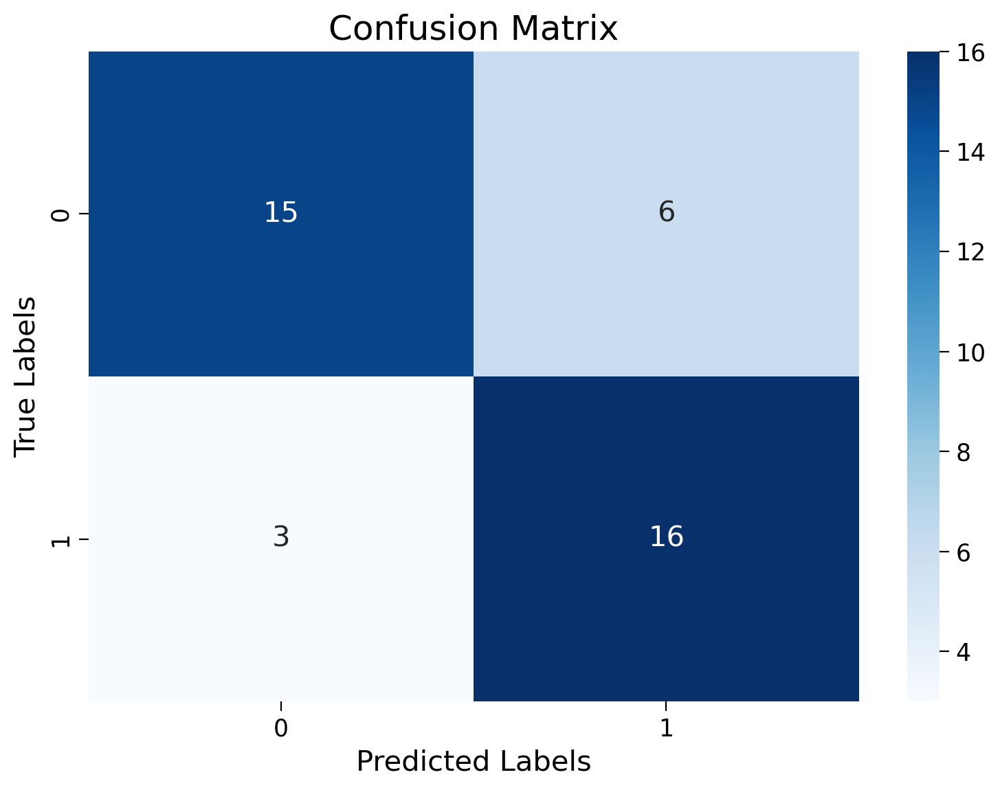

In [82]:
# Plot confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#### So we finally got the Logistic Regression and SVM as our best models to predict the fearful or neutral faces based on the connectivity with the **"R-FFC"** as seed region.  
SVM 5-fold CV: 0.735  
XGBoost 5-fold CV: 0.71  
LR 5-fold CV: 0.735

Getting the feature weigths of the logistic regression model

In [83]:
feature_weights = logistic_model.coef_[0]
feature_weights_list = list(enumerate(feature_weights))
feature_names = new_region_names

In [84]:
# Create a list of tuples containing feature indices and corresponding weights
feature_weights_list = list(enumerate(feature_weights))
feature_name_list = [feature_weights_list[i] + (feature_names[i],) for i in range(len(feature_weights_list))]
# Sort the feature weights in descending order of absolute values
sorted_feature_weights = sorted(feature_name_list, key=lambda x: abs(x[1]), reverse = True)
top_10_features = sorted_feature_weights[:10]

In [85]:
top_feature_indices = []
top_feature_names = []
top_feature_weights = []
for i in range(len(top_10_features)):
    top_feature_indices.append(top_10_features[i][0])
    top_feature_weights.append(top_10_features[i][1])
    top_feature_names.append(top_10_features[i][2])

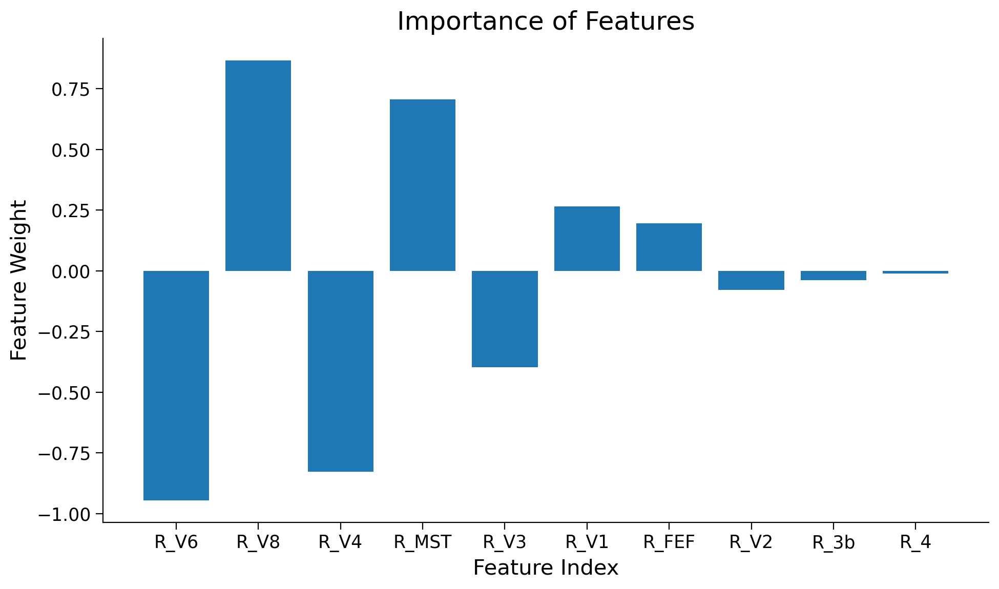

In [86]:
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_names)), top_feature_weights, align='center')
plt.xticks(range(len(top_feature_names)), top_feature_names)
plt.xlabel('Feature Index')
plt.ylabel('Feature Weight')
plt.title('Importance of Features')
plt.show()

#### To plot the connectivity matrix for the fearful and neutral face tasks 

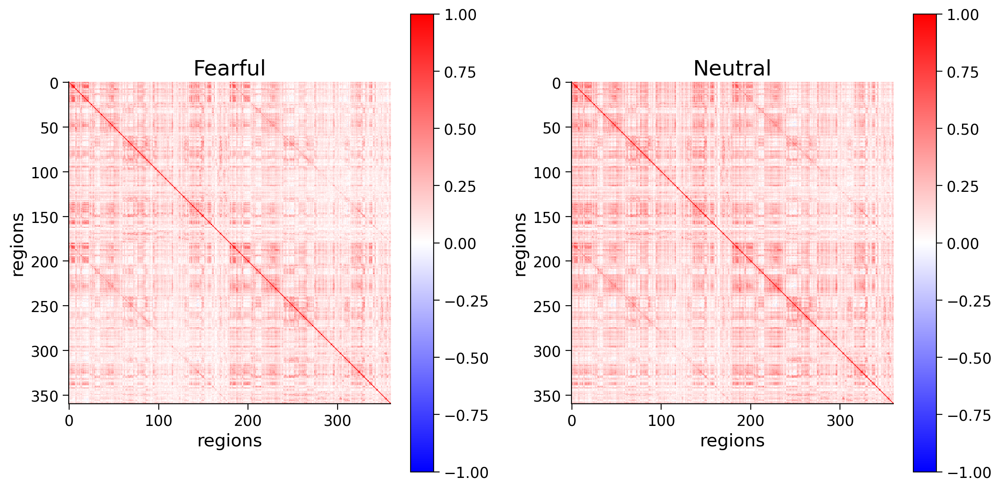

In [87]:
group_fc_fear = fc_fear.mean(axis=0)
group_fc_neut = fc_neut.mean(axis=0)
# Assuming we already have the data group_fc_ten and other parameters set

# Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the first image on the first subplot (axes[0])
im1 = axes[0].imshow(group_fc_fear, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
axes[0].set_xlabel('regions')
axes[0].set_ylabel('regions')
axes[0].set_title('Fearful')
plt.colorbar(im1, ax=axes[0])

# Plot the second image on the second subplot (axes[1])
im2 = axes[1].imshow(group_fc_neut, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
axes[1].set_xlabel('regions')
axes[1].set_ylabel('regions')
axes[1].set_title('Neutral')
plt.colorbar(im2, ax=axes[1])

# Adjust layout to prevent overlapping of labels and titles
plt.tight_layout()

# Display the plot
plt.show()


Plotting connectivity for **"R-FFC"** as the seed region with other regions

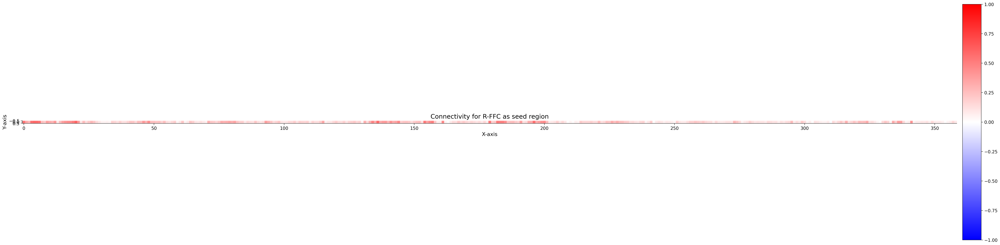

In [88]:
# Assuming we already have the data group_fc_fear_X and other parameters set
# Create a 1x2 grid with adjustable width ratios
fig = plt.figure(figsize=(40, 10))
gs = gridspec.GridSpec(1, 2, width_ratios=[50, 1])

gp_fc_fear_seed = group_fc_fear
# Plot the main image in the first subplot (gs[0])
ax_main = plt.subplot(gs[0])
im = ax_main.imshow(X_n.mean(axis=0).reshape(1, 359), interpolation="none", cmap="bwr", vmin=-1, vmax=1)
ax_main.set_xlabel('X-axis')
ax_main.set_ylabel('Y-axis')
ax_main.set_title('Connectivity for R-FFC as seed region')

# Show the colorbar in the second subplot (gs[1])
ax_cbar = plt.subplot(gs[1])
plt.colorbar(im, cax=ax_cbar)

# Adjust layout to prevent overlapping of labels and titles
plt.tight_layout()

# Display the plot
plt.show()


Plotting the connectivity matrix of the most important features in the PCA analysis

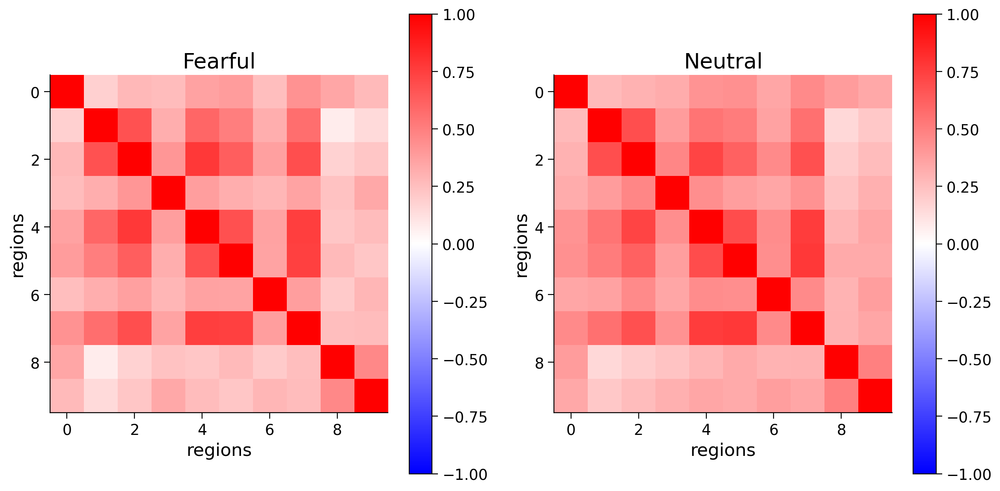

In [89]:
group_fc_fear = fc_fear.mean(axis=0)
group_fc_neut = fc_neut.mean(axis=0)
# Assuming we already have the data group_fc_ten and other parameters set
group_fc_fear_pca = group_fc_fear[top_feature_indices, :][:, top_feature_indices]
group_fc_neut_pca = group_fc_neut[top_feature_indices, :][:, top_feature_indices]
# Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the first image on the first subplot (axes[0])
im1 = axes[0].imshow(group_fc_fear_pca, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
axes[0].set_xlabel('regions')
axes[0].set_ylabel('regions')
axes[0].set_title('Fearful')
plt.colorbar(im1, ax=axes[0])

# Plot the second image on the second subplot (axes[1])
im2 = axes[1].imshow(group_fc_neut_pca, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
axes[1].set_xlabel('regions')
axes[1].set_ylabel('regions')
axes[1].set_title('Neutral')
plt.colorbar(im2, ax=axes[1])

# Adjust layout to prevent overlapping of labels and titles
plt.tight_layout()

# Display the plot
plt.show()


/opt/conda/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


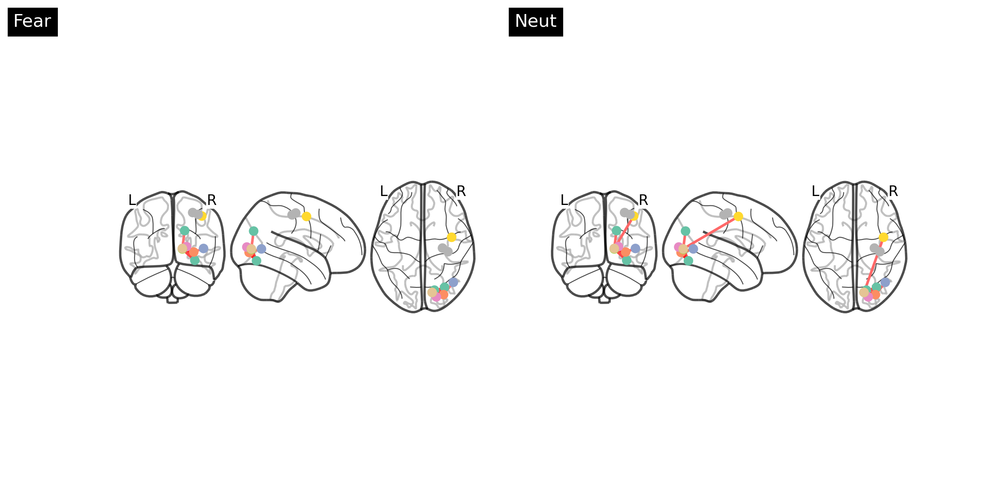

In [90]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plotting.plot_connectome(group_fc_fear_pca, atlas["coords"][top_feature_indices], edge_threshold="70%", title="Fear", axes=axes[0])
plotting.plot_connectome(group_fc_neut_pca, atlas["coords"][top_feature_indices], edge_threshold="70%", title = "Neut", axes=axes[1])

In [91]:
plotting.view_connectome(group_fc_neut_pca, atlas["coords"][top_feature_indices], edge_threshold="70%", title = "fear")

In [92]:
plotting.view_connectome(group_fc_neut_pca, atlas["coords"][top_feature_indices], edge_threshold="70%", title = "Neut")

#### Running the logistic regression model on the whole dataset without PCA analysis

In [93]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_n, y_n, test_size=0.2, random_state=42)

Accuracy: 0.75
Cross-validation scores: [0.775 0.65  0.725 0.775 0.75 ]
Average accuracy: 0.735
Accuracy: 0.75
Precision: 0.7142857142857143
Recall: 0.7894736842105263
F1 Score: 0.7500000000000001
Confusion Matrix:
[[15  6]
 [ 4 15]]


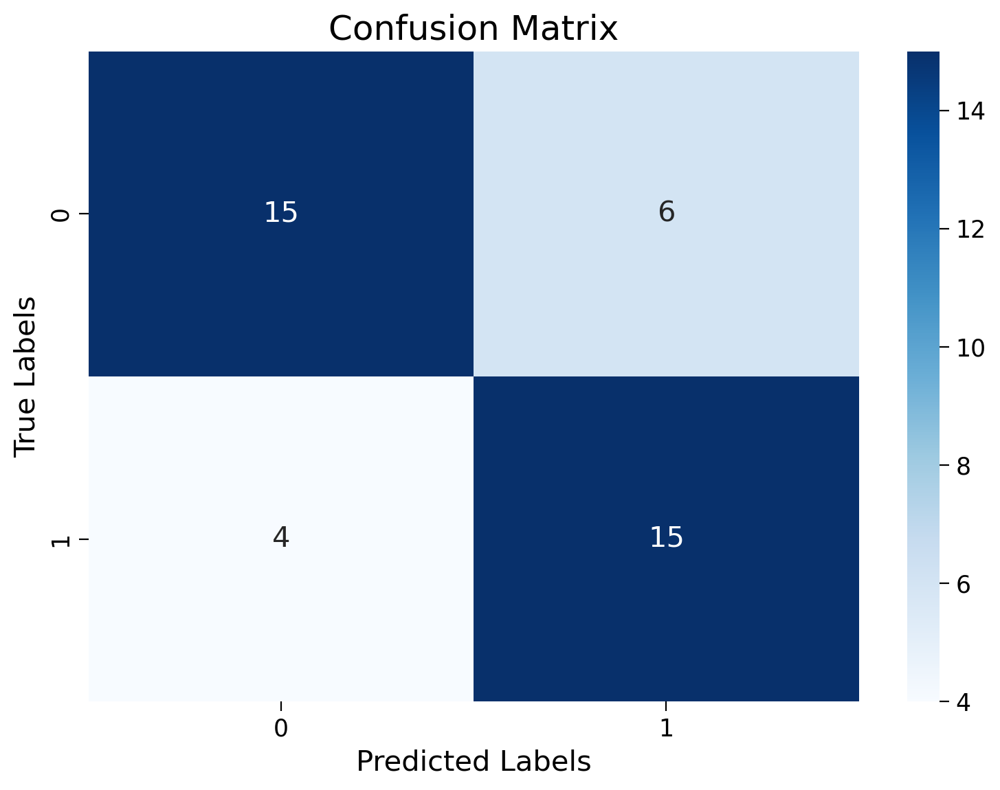

In [94]:
# Create the logistic regression model
logistic_model = LogisticRegression()

# Train the model on the PCA dimensionality reduced training data
logistic_model.fit(X_train, y_train)
# Make predictions on the test data
y_pred = logistic_model.predict(X_test)
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
scores = cross_val_score(logistic_model, X_pca, y_n, cv=kf)
print("Cross-validation scores:", scores)
print("Average accuracy:", np.mean(scores))
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
## model evaluation
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)
# Plot confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# 7. Applying the DL model on full connectivity of the brain

In [95]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

Prepare the data

In [96]:
X_DL = np.concatenate((fc_fear, fc_neut), axis=0)
y_DL = copy.deepcopy(y_n)

In [97]:
train_fc, test_fc, train_fc_label, test_fc_labels = train_test_split(X_DL, y_DL, test_size=0.2, random_state=42)

In [98]:
# Assuming you have your data and labels
train_data = train_fc # Shape: (160, 360, 360)
test_data = test_fc # shape: (40, 360, 360)
labels = train_fc_label  # Shape: (160,)

# Convert NumPy arrays to PyTorch tensors
data_tensor = torch.tensor(train_data, dtype=torch.float32)
test_data_tensor = torch.tensor(test_data, dtype=torch.float32)
labels_tensor = torch.tensor(labels, dtype=torch.long)
test_labels_tensor = torch.tensor(test_fc_labels, dtype=torch.long)

# Create a dataset and data loader
dataset = TensorDataset(data_tensor, labels_tensor)
test_dataset = TensorDataset(test_data_tensor, test_labels_tensor)
data_loader = DataLoader(dataset, batch_size=16, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [99]:
# Define a simple MLP model
class MLPModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(MLPModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, num_classes)
        
    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x
    
# Initialize the model
input_size = 360 * 360
hidden_size = 128
num_classes = 2
model = MLPModel(input_size, hidden_size, num_classes)

In [100]:
# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [101]:
# Training loop
num_epochs = 30
losses = []
for epoch in range(num_epochs):
    # Wrap the data_loader with tqdm
    with tqdm(data_loader, desc=f"Epoch [{epoch+1}/{num_epochs}]") as t:
        for inputs, labels in t:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            t.set_postfix(loss=loss.item())  # Update progress bar
# Append loss value to the list
            losses.append(loss.item())
            
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

Epoch [1/30]: 100%|██████████| 10/10 [00:02<00:00,  3.79it/s, loss=4.18]


Epoch [1/30], Loss: 4.1766


Epoch [2/30]: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s, loss=1.18]


Epoch [2/30], Loss: 1.1810


Epoch [3/30]: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s, loss=0.76]


Epoch [3/30], Loss: 0.7599


Epoch [4/30]: 100%|██████████| 10/10 [00:02<00:00,  4.24it/s, loss=0.0126]


Epoch [4/30], Loss: 0.0126


Epoch [5/30]: 100%|██████████| 10/10 [00:02<00:00,  4.18it/s, loss=0.0023]


Epoch [5/30], Loss: 0.0023


Epoch [6/30]: 100%|██████████| 10/10 [00:02<00:00,  4.04it/s, loss=0.00125]


Epoch [6/30], Loss: 0.0012


Epoch [7/30]: 100%|██████████| 10/10 [00:02<00:00,  3.72it/s, loss=0.0007]


Epoch [7/30], Loss: 0.0007


Epoch [8/30]: 100%|██████████| 10/10 [00:02<00:00,  4.03it/s, loss=2.96e-5]


Epoch [8/30], Loss: 0.0000


Epoch [9/30]: 100%|██████████| 10/10 [00:02<00:00,  4.11it/s, loss=1.59e-5]


Epoch [9/30], Loss: 0.0000


Epoch [10/30]: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s, loss=0.000222]


Epoch [10/30], Loss: 0.0002


Epoch [11/30]: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s, loss=2.69e-5]


Epoch [11/30], Loss: 0.0000


Epoch [12/30]: 100%|██████████| 10/10 [00:02<00:00,  4.16it/s, loss=9.28e-5]


Epoch [12/30], Loss: 0.0001


Epoch [13/30]: 100%|██████████| 10/10 [00:02<00:00,  3.98it/s, loss=0.000143]


Epoch [13/30], Loss: 0.0001


Epoch [14/30]: 100%|██████████| 10/10 [00:02<00:00,  4.19it/s, loss=0.000155]


Epoch [14/30], Loss: 0.0002


Epoch [15/30]: 100%|██████████| 10/10 [00:02<00:00,  4.18it/s, loss=9.66e-5]


Epoch [15/30], Loss: 0.0001


Epoch [16/30]: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s, loss=4.18e-5]


Epoch [16/30], Loss: 0.0000


Epoch [17/30]: 100%|██████████| 10/10 [00:02<00:00,  4.13it/s, loss=7.02e-5]


Epoch [17/30], Loss: 0.0001


Epoch [18/30]: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s, loss=0.000402]


Epoch [18/30], Loss: 0.0004


Epoch [19/30]: 100%|██████████| 10/10 [00:02<00:00,  4.01it/s, loss=0.000149]


Epoch [19/30], Loss: 0.0001


Epoch [20/30]: 100%|██████████| 10/10 [00:02<00:00,  3.67it/s, loss=7.59e-5]


Epoch [20/30], Loss: 0.0001


Epoch [21/30]: 100%|██████████| 10/10 [00:02<00:00,  4.19it/s, loss=4.88e-5]


Epoch [21/30], Loss: 0.0000


Epoch [22/30]: 100%|██████████| 10/10 [00:02<00:00,  4.24it/s, loss=0.00019]


Epoch [22/30], Loss: 0.0002


Epoch [23/30]: 100%|██████████| 10/10 [00:02<00:00,  4.22it/s, loss=8.82e-6]


Epoch [23/30], Loss: 0.0000


Epoch [24/30]: 100%|██████████| 10/10 [00:02<00:00,  4.21it/s, loss=0.000122]


Epoch [24/30], Loss: 0.0001


Epoch [25/30]: 100%|██████████| 10/10 [00:02<00:00,  4.03it/s, loss=9.39e-5]


Epoch [25/30], Loss: 0.0001


Epoch [26/30]: 100%|██████████| 10/10 [00:02<00:00,  4.15it/s, loss=7.94e-5]


Epoch [26/30], Loss: 0.0001


Epoch [27/30]: 100%|██████████| 10/10 [00:02<00:00,  4.14it/s, loss=0.00012]


Epoch [27/30], Loss: 0.0001


Epoch [28/30]: 100%|██████████| 10/10 [00:02<00:00,  4.18it/s, loss=5.57e-5]


Epoch [28/30], Loss: 0.0001


Epoch [29/30]: 100%|██████████| 10/10 [00:02<00:00,  4.23it/s, loss=4.48e-5]


Epoch [29/30], Loss: 0.0000


Epoch [30/30]: 100%|██████████| 10/10 [00:02<00:00,  4.11it/s, loss=1.21e-5]

Epoch [30/30], Loss: 0.0000


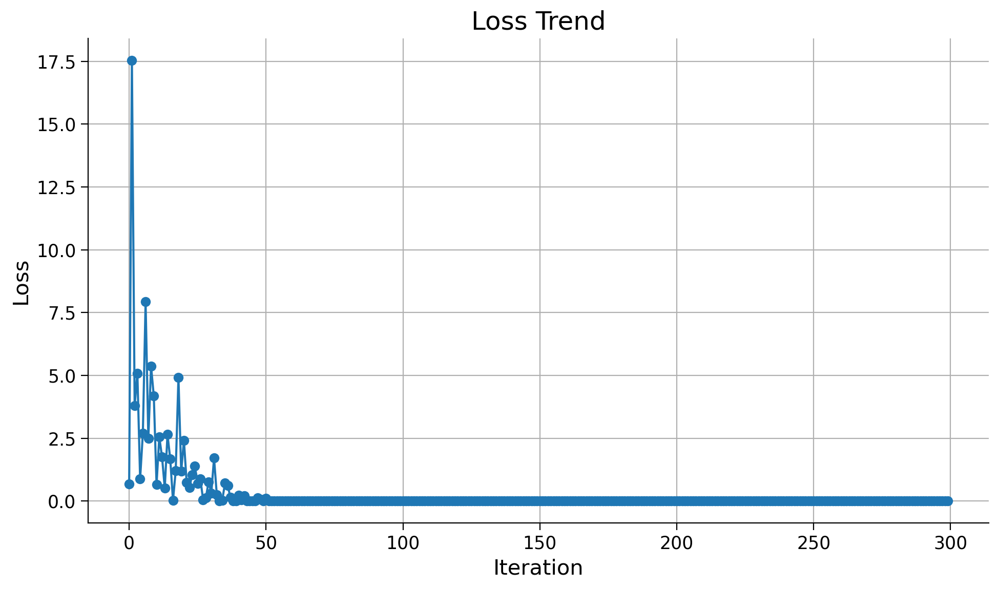

In [102]:
# Plot loss trend
plt.figure(figsize=(10, 6))
plt.plot(losses, marker='o')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Loss Trend')
plt.grid(True)
plt.show()

In [103]:
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_data_loader:  # Use your test data loader
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = correct / total
print("Accuracy:", accuracy)

Accuracy: 0.5


In [104]:
all_predictions = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_data_loader:  # Use your test data loader
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        all_predictions.extend(predicted.tolist())
        all_labels.extend(labels.tolist())

cm = confusion_matrix(all_labels, all_predictions)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[10 11]
 [ 9 10]]


In [105]:
report = classification_report(all_labels, all_predictions)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.48      0.50        21
           1       0.48      0.53      0.50        19

    accuracy                           0.50        40
   macro avg       0.50      0.50      0.50        40
weighted avg       0.50      0.50      0.50        40



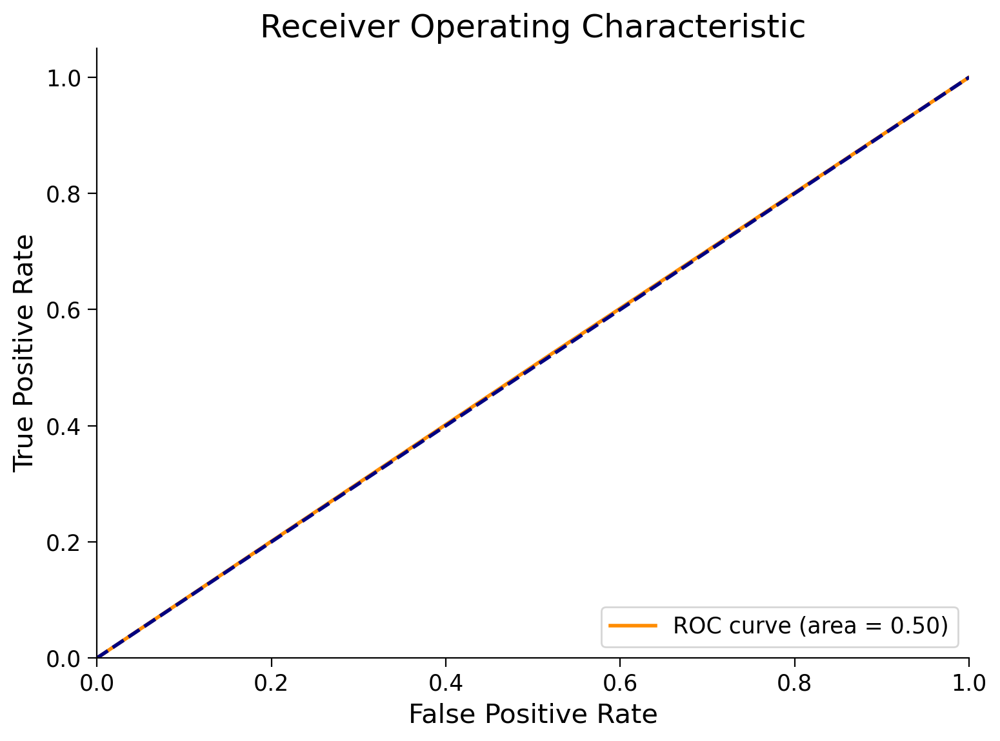

In [106]:
fpr, tpr, _ = roc_curve(all_labels, all_predictions)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()